## Preamble

In [261]:
vmin=490.8
vmax=1990

h=6

nz=259; nx=1111

dt=0.0018
nt=5554  #10 s

ntr=2220

In [262]:
import numpy as np
import matplotlib.pyplot as plt


z=np.arange(0,nz)*h
x=np.arange(0,nx)*h

def read(filename,n=(nx,nz)):
    return np.fromfile(filename,dtype='float32').reshape(n).T

def read_su(filename,n=(ntr,nt)):
    data=read(filename,n=(n[0],int(60+n[1])))
    return data[60:,:]

def imshow(data,perc=None,clip=None,clipmin=None,extent=None,cmap='viridis',title=None,title_colorbar=None,grid=True):
    if perc==None:
        clipp=[np.amin(data),np.amax(data)]
    else:
        tmp=np.percentile(np.abs(data),q=perc)
        clipp=[-tmp,tmp]
    
    if clip!=None: clipp=clip
    
    if clipmin!=None: clipp[0]=clipmin
    
    plt.imshow(data,vmin=clipp[0],vmax=clipp[1],cmap=cmap,extent=extent,aspect='auto')
    cbar=plt.colorbar(location='right')
    cbar=cbar.ax.set_ylabel(title_colorbar)
    if grid==True: plt.grid(visible=grid, axis='both', which='both', color='w', linestyle='--',linewidth=0.5)
    #plt.xlabel(labels[0]); plt.ylabel(labels[1])
    if title!=None: plt.title(title)

def run(app='../../exe/FWD',setup='setup',np=1,nthreads=8,out=None):
    '''
    run(app,setup,np=1,nthreads=8)
    run in a bash env
    ----------------------------
    app      : application/executable to run
    setup    : setup file
    np       : number of MPI processors (default=1)
    nthreads : number of OpenMP threads (default=8)
    
    Caveat: np*nthreads should not exceed total number of CPU cores
    otherwise the running will be very slow
    '''
    
    !echo 'ulimit -s unlimited' > run.sh
    str=f"export OMP_NUM_THREADS={nthreads}"
    !echo $str >> run.sh
    str=f"{app} {setup}"
    !echo $str >> run.sh
    !chmod +x run.sh
    if out==None:
        !./run.sh
    else:
        !./run.sh > {out}

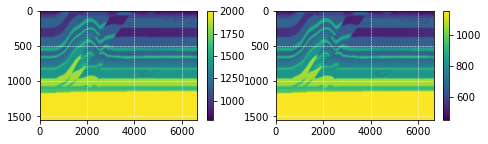

In [263]:
#plot
plt.figure(figsize=(12,2))
true=read('true',(3*nx,nz))
plt.subplot(1,3,1); imshow(true[:,:nx],clip=[788,2000],extent=(0,(nx-1)*h,(nz-1)*h,0))
plt.subplot(1,3,2); imshow(true[:,nx:2*nx],clip=[455,1154],extent=(0,(nx-1)*h,(nz-1)*h,0))

In [264]:
!cat setup_default_overthrust

MODEL_SIZE              '259  1111 1'
MODEL_SPACING           '6    6    1'
FILE_MODEL              'true'
MODEL_ATTRIBUTES        'vp vs rho'
MODEL_ATTRIBUTES_WRITE  'vp vs'
FILE_TOPO                none

IS_FREESURFACE          T

ACQUI_GEOMETRY          spread
FS                      '  0   166.5  0'
DS                      '  0   166.5  0'
NS                      39
FR                      '  0     0  0'
DR                      '  0     3  0'
NR                      2220

SCOMP                    pz
RCOMP                   'pz px ex'

NT           5554
DT           0.0018

WAVELET_TYPE	ricker


#############
## for FWI ##
#############
FILE_DATA_PREFIX    './res_obs/Ru_Shot'
NBATCH               39
WEIGHTING           'none'

FPEAK           6.54

PARAMETER           'vp:850:1990 vs:490.75:1148.93'

IF_PARA_SCAL         T

SMOOTHING            Laplacian
LAP_FRAC         '0.1 0.1 0.1'

#PRECO           'z^0'

JOB             gradient

#SNAPSHOT     'p vz'
#NSNAPSHOT    50

MAX_ITERA

## Valid PE modeling vs VS modeling

### w/o FreeSurf

In [265]:
make_FWDrun_ALFAHD(app='fwd_PSV_FDSG_O4_compute',resdir='1shot_VS',np=1,tag='01',
                   setup_more=['IS_FREESURFACE  F','NS   1','SCOMP   vz',"RCOMP   'vz vx'"]
                  )
#--> 62048
                           
make_FWDrun_ALFAHD(app='fwd_DAS_FDSG_O4_compute',resdir='1shot_PE',np=1,tag='02',
                   setup_more=['IS_FREESURFACE  F','NS   1'])
#--> 62049 26s

NameError: name 'make_FWDrun_ALFAHD' is not defined

In [ ]:
plt.figure(figsize=(12,4))
data1=read_su('1shot_VS/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data1,perc=90,title='vz-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('1shot_PE/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data2,perc=90,title='pz-pz',cmap='gray')

plt.figure(figsize=(12,4))
imshow(data1-data2,perc=90,title='diff',cmap='gray')

In [ ]:
plt.figure(figsize=(12,4))
data1=read_su('1shot_VS/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data1,perc=90,title='vz-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('1shot_PE/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data2,perc=90,title='pz-px',cmap='gray')

plt.figure(figsize=(12,4))
imshow(data1-data2,perc=90,title='diff',cmap='gray')

Without free surface, VS & PE modeling is almost the same. OK.

### w FreeSurf

In [ ]:
make_FWDrun_ALFAHD(app='fwd_PSV_FDSG_O4_compute',resdir='1shot_VS_FreeSurf',np=1,tag='01',
                   setup_more=['NS   1','SCOMP   vz',"RCOMP   'vz vx'"]
                  )
#--> 62047
                           
make_FWDrun_ALFAHD(app='fwd_DAS_FDSG_O4_compute',resdir='1shot_PE_FreeSurf',np=1,tag='02',
                   setup_more=['NS   1'])
#--> 62052 26s

In [ ]:
plt.figure(figsize=(12,4))
data1=read_su('1shot_VS_FreeSurf/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data1,perc=90,title='vz-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('1shot_PE_FreeSurf/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data2,perc=90,title='pz-pz',cmap='gray')

plt.figure(figsize=(12,4))
imshow(data1-data2,perc=90,title='diff',cmap='gray')

In [ ]:
plt.figure(figsize=(12,4))
data1=read_su('1shot_VS_FreeSurf/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data1,perc=90,title='vz-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('1shot_PE_FreeSurf/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data2,perc=90,title='pz-px',cmap='gray')

plt.figure(figsize=(12,4))
imshow(data1-data2,perc=90,title='diff',cmap='gray')

## VS modeling, symm vs trunc on vz src

### VS modeling + Stress Image

In [ ]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

In [ ]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_trunc" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

In [ ]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data1,perc=90,title='vz-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_VS_trunc/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2,perc=90,title='vz-vz',cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

In [ ]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data1,perc=90,title='vz-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_VS_trunc/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2,perc=90,title='vz-vx',cmap='gray')

print( np.sum(np.abs(data1)) / np.sum(np.abs(data2)) )

In case of FreeSurface, adding vz force should be 'truncate', instead of 'symmetric'

## Valid PE modeling vs VS modeling

In [379]:
!bash recompile.sh

rm *.o

rm ../../mod/m_model.mod ../../mod/m_shotlist_batching.mod ../../mod/m_shot.mod ../../mod/m_computebox.mod ../../mod/m_field.mod ../../mod/m_correlate.mod ../../mod/m_cpml.mod ../../mod/m_propagator_PSV_FDSG_O4.mod ../../mod/m_Modeling.mod ../../mod/m_shotlist.mod ../../mod/m_cpml.mod ../../mod/m_propagator.mod ../../mod/m_modeling.mod ../../mod/m_propagator_WPI.mod
rm: cannot remove '../../mod/m_shotlist_batching.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_PSV_FDSG_O4.mod': No such file or directory
rm: cannot remove '../../mod/m_Modeling.mod': No such file or directory
rm: cannot remove '../../mod/m_cpml.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_WPI.mod': No such file or directory
make: [Makefile:24: clean] Error 1 (ignored)

(cd FWD; make)
make[1]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/FWD'
#System
(cd ../Modules/System; make)
make[2]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/Modules/S


mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_correlate.f90 -o m_correlate.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_cpml.f90 -o m_cpml.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_propagator_DAS_FDSG_O4.f90 -o m_propagator_DAS_FDSG_O4.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_Modeling.f90 -o m_Modeling.o


make[2]: Leaving directo

In [380]:
vp = np.interp(np.arange(ntr)/2, np.arange(nx), np.average(true[:1,:nx    ],axis=0) )
vs = np.interp(np.arange(ntr)/2, np.arange(nx), np.average(true[:1,nx:2*nx],axis=0) )

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

### vz or pz force

In [381]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 673976 Mar 25 19:02 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:02:15
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth
 Output directory:res_VS_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

In [382]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR         '  3     0  0'" >> setup
!echo "SCOMP         pz" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 19:02 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:02:44
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth
 Output directory:res_PE_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

#### vz-szz

1.0154223778287434


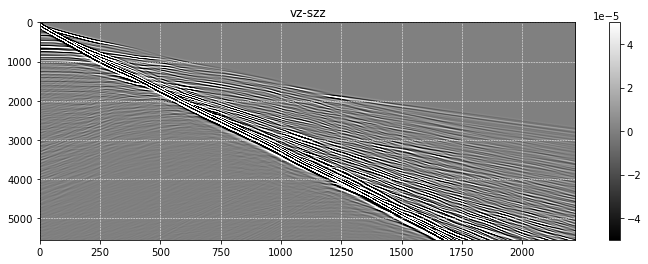

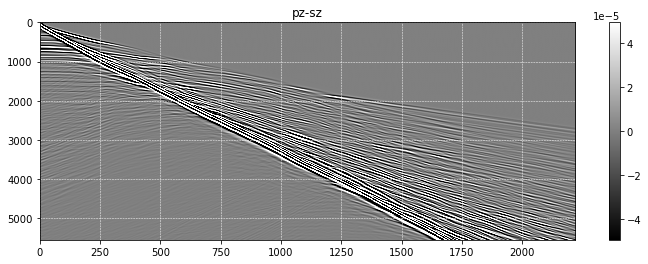

In [383]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1_sz,perc=90,title='vz-szz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sz= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2_sz,perc=90,title='pz-sz',cmap='gray')

print( np.sum(np.abs(data1_sz)) / np.sum(np.abs(data2_sz)) )

(2000.0, 5500.0)

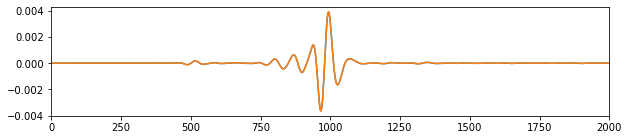

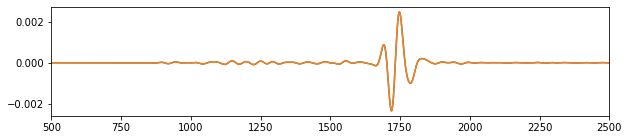

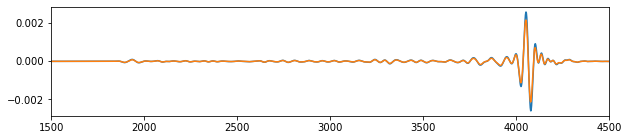

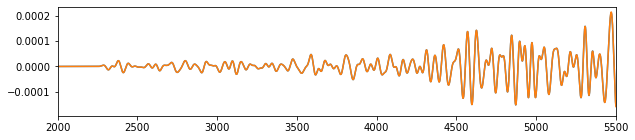

In [384]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((2000, 5500))

#### vz-sxx

1.008223491169223


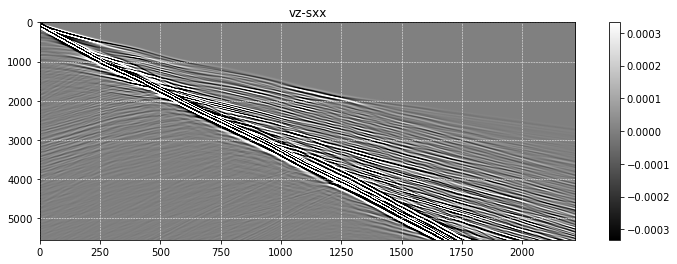

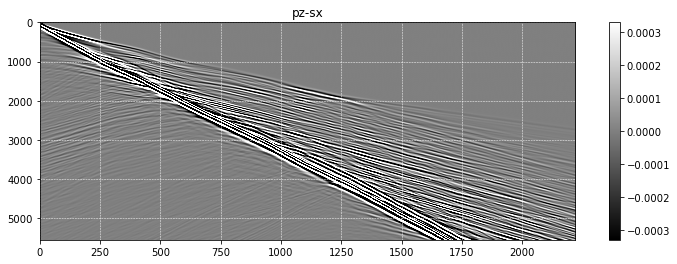

In [385]:
plt.figure(figsize=(12,4))
data1_sx=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1_sx,perc=90,title='vz-sxx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sx= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2_sx,perc=90,title='pz-sx',cmap='gray')

print( np.sum(np.abs(data1_sx)) / np.sum(np.abs(data2_sx)) )

(2000.0, 5500.0)

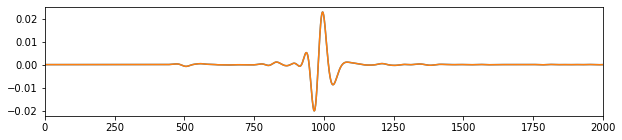

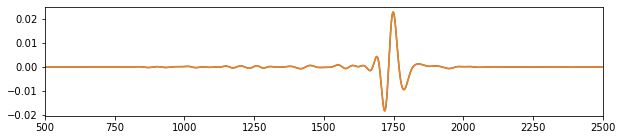

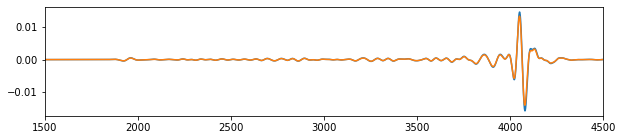

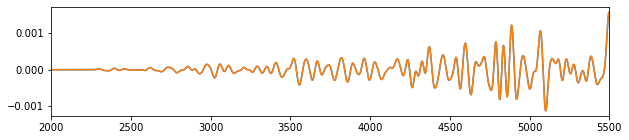

In [386]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((2000, 5500))

#### vz-ez

1.006458843715183


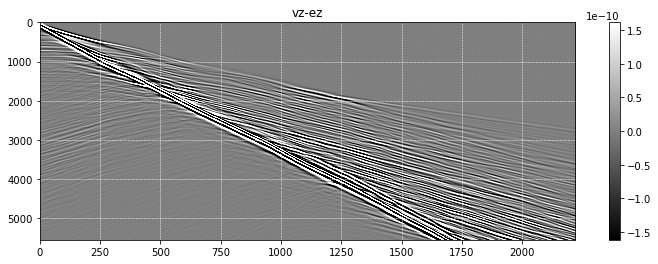

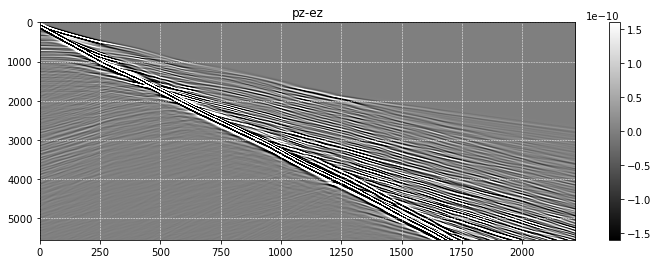

In [387]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ez= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1_ez,perc=90,title='vz-ez',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2_ez,perc=90,title='pz-ez',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

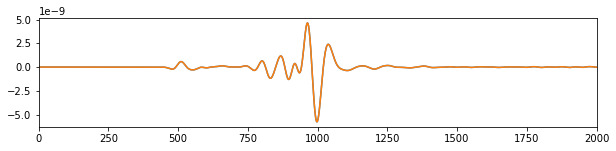

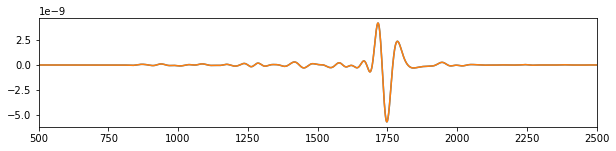

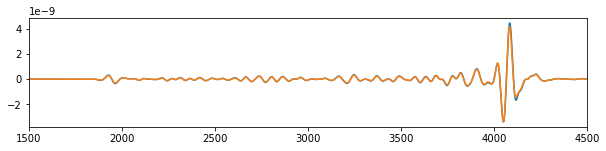

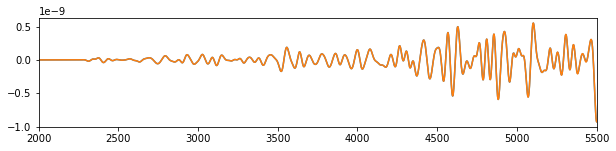

In [388]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

#### vz-ex

1.008837824867849


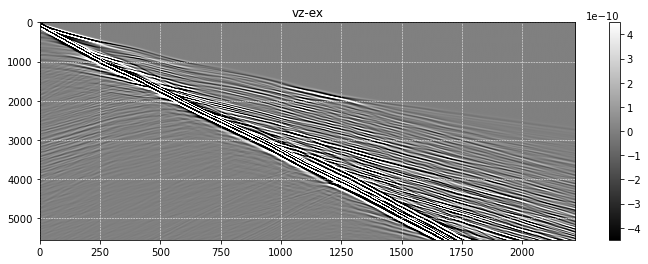

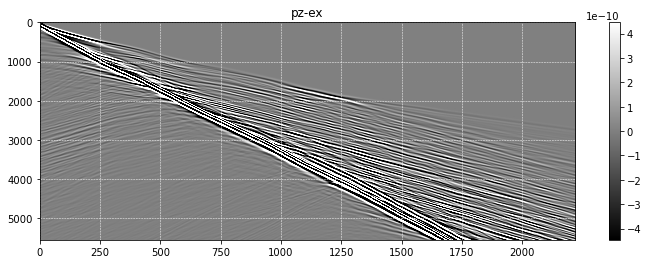

In [389]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ex= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1_ex,perc=90,title='vz-ex',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2_ex,perc=90,title='pz-ex',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

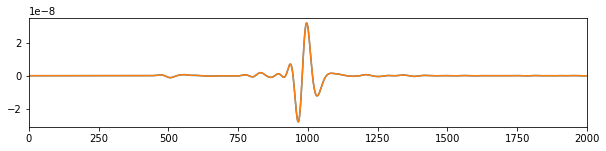

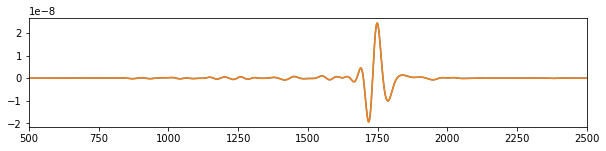

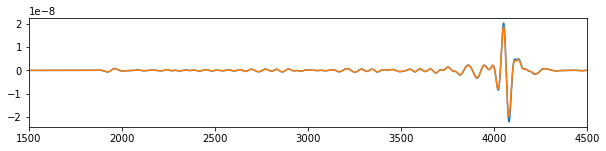

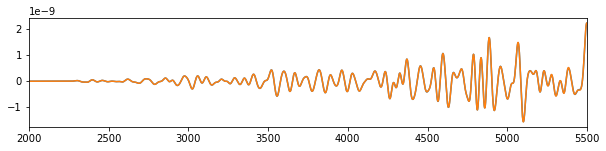

In [390]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((2000, 5500))

#### vz-ss-es

1.0062424499814044


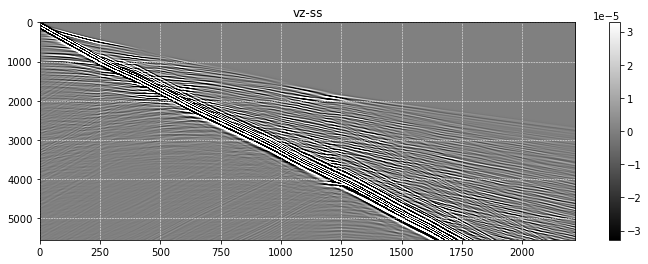

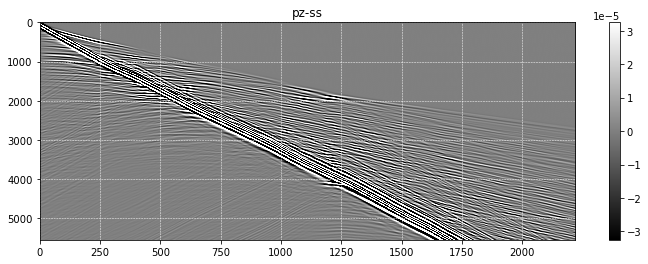

In [391]:
plt.figure(figsize=(12,4))
data1_ss=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1_ss,perc=90,title='vz-ss',cmap='gray')

plt.figure(figsize=(12,4))
data2_ss=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2_ss,perc=90,title='pz-ss',cmap='gray')

print( np.sum(np.abs(data1_ss)) / np.sum(np.abs(data2_ss)) )

(2000.0, 5500.0)

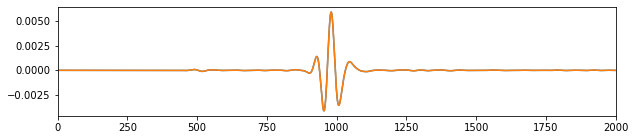

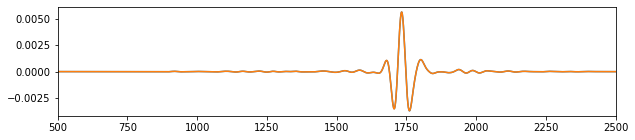

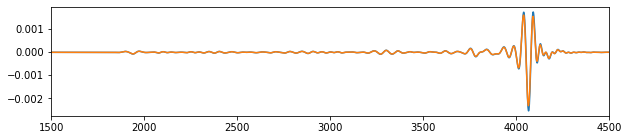

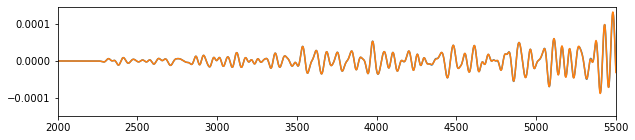

In [392]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((2000, 5500))

### vx or px force

In [393]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         vx" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth_vx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 673976 Mar 25 19:02 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:03:28
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_vx
 Output directory:res_VS_overth_vx/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

In [394]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         px" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth_px" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 19:02 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:03:51
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_px
 Output directory:res_PE_overth_px/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### vx-szz

1.014352918357118


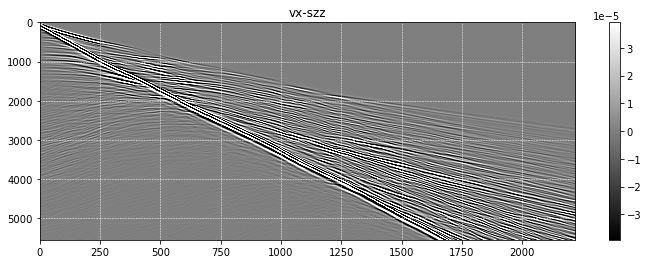

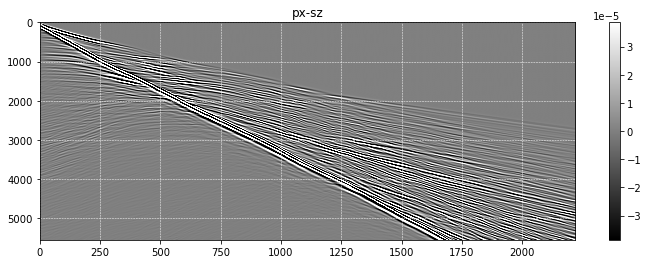

In [395]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1_sz,perc=90,title='vx-szz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sz= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2_sz,perc=90,title='px-sz',cmap='gray')

print( np.sum(np.abs(data1_sz)) / np.sum(np.abs(data2_sz)) )

(2000.0, 5500.0)

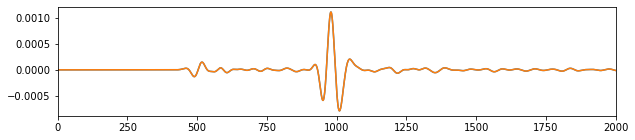

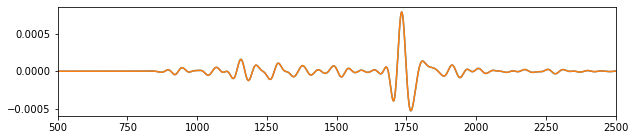

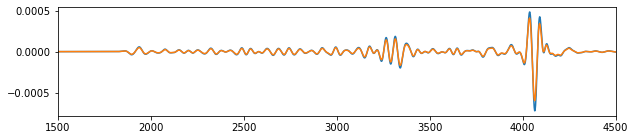

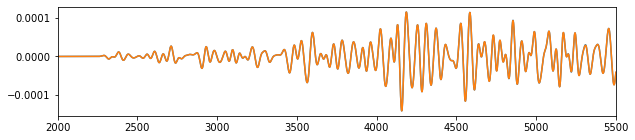

In [396]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((2000, 5500))

#### vx-sxx

1.0079751222898379


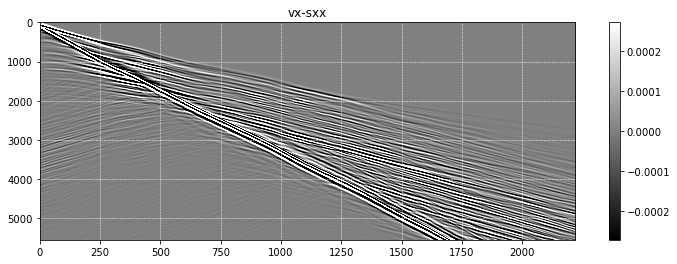

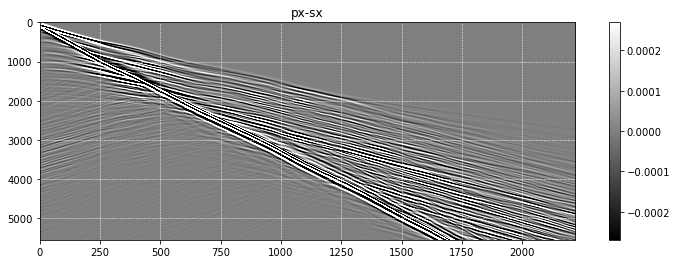

In [397]:
plt.figure(figsize=(12,4))
data1_sx=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1_sx,perc=90,title='vx-sxx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sx= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2_sx,perc=90,title='px-sx',cmap='gray')

print( np.sum(np.abs(data1_sx)) / np.sum(np.abs(data2_sx)) )

(2000.0, 5500.0)

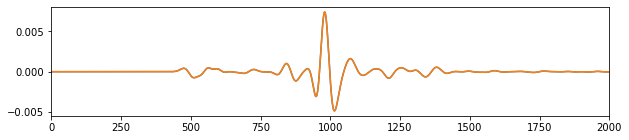

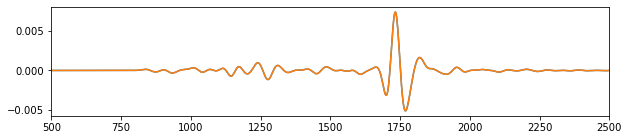

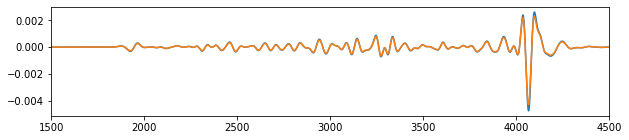

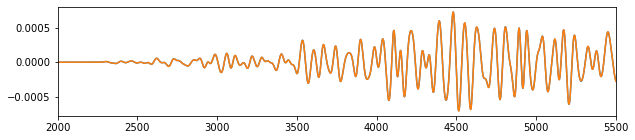

In [398]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((2000, 5500))

#### vx-ez

1.0082357397734605


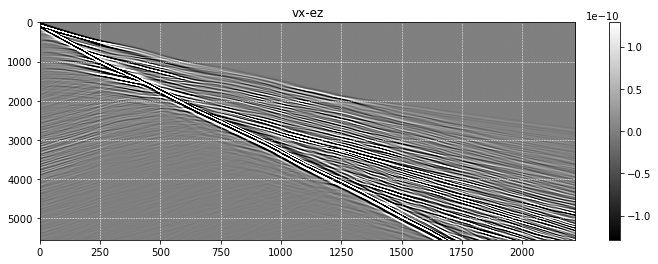

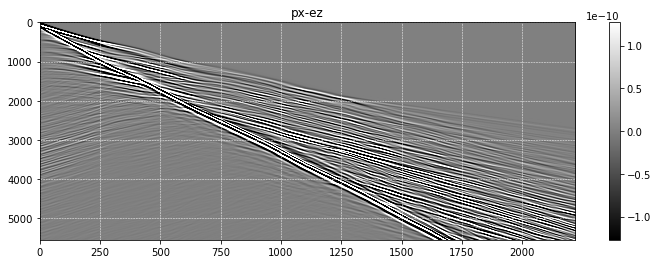

In [399]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ez= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1_ez,perc=90,title='vx-ez',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2_ez,perc=90,title='px-ez',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

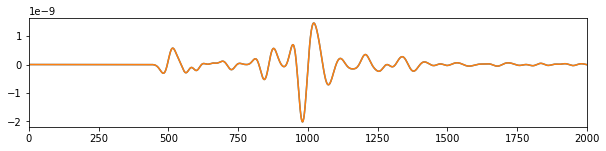

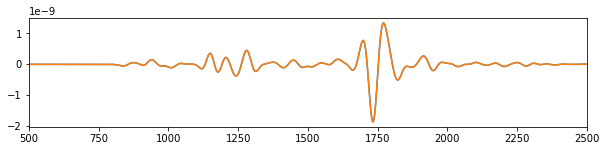

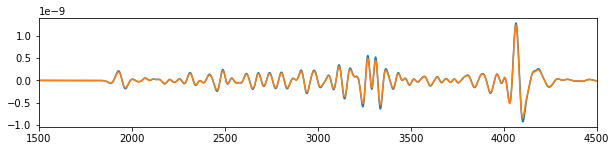

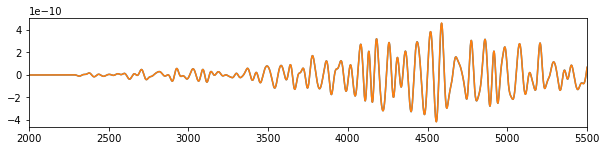

In [400]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

#### vx-ex

1.008515150504024


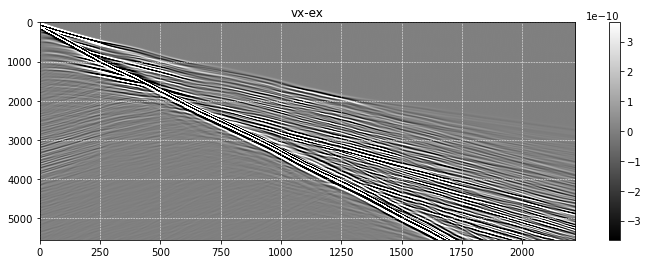

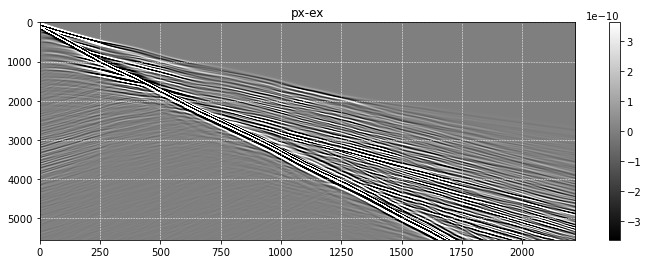

In [401]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ex= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1_ex,perc=90,title='vx-ex',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2_ex,perc=90,title='px-ex',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

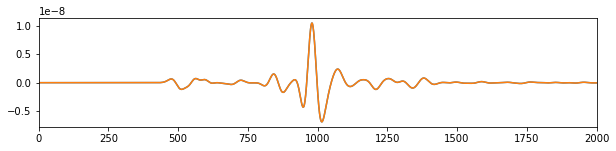

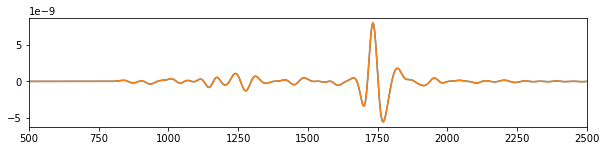

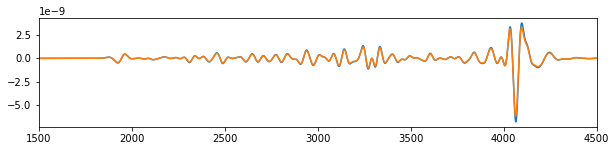

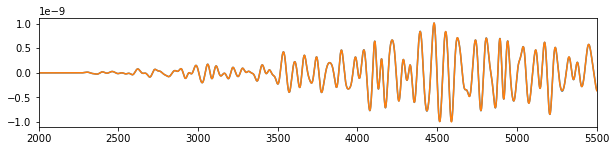

In [402]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((2000, 5500))

#### vx-ss-es

1.0062947825195832


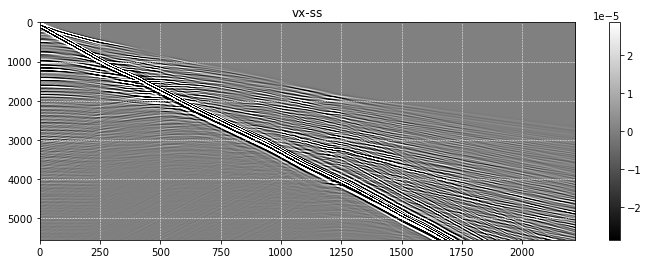

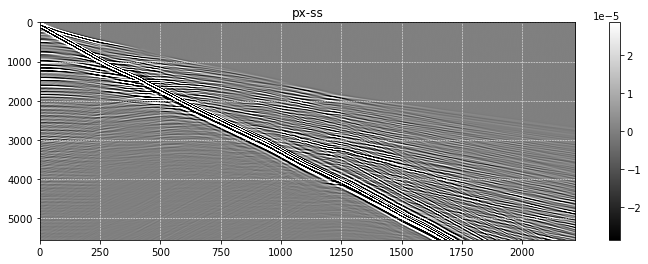

In [403]:
plt.figure(figsize=(12,4))
data1_ss=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1_ss,perc=90,title='vx-ss',cmap='gray')

plt.figure(figsize=(12,4))
data2_ss=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2_ss,perc=90,title='px-ss',cmap='gray')

print( np.sum(np.abs(data1_ss)) / np.sum(np.abs(data2_ss)) )

(2000.0, 5500.0)

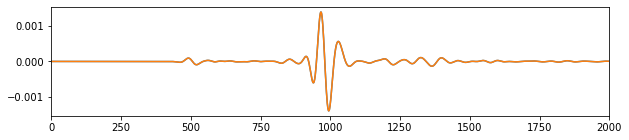

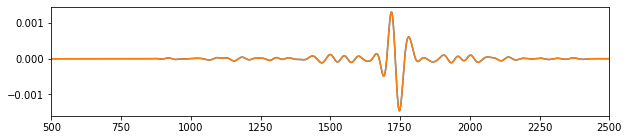

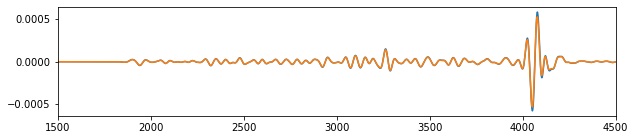

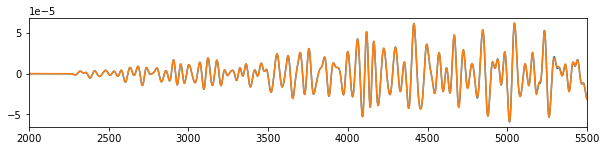

In [404]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((2000, 5500))

## Valid PE modeling vs VS modeling

In [405]:
!bash recompile.sh

rm *.o

rm ../../mod/m_model.mod ../../mod/m_shotlist_batching.mod ../../mod/m_shot.mod ../../mod/m_computebox.mod ../../mod/m_field.mod ../../mod/m_correlate.mod ../../mod/m_cpml.mod ../../mod/m_propagator_PSV_FDSG_O4.mod ../../mod/m_Modeling.mod ../../mod/m_shotlist.mod ../../mod/m_cpml.mod ../../mod/m_propagator.mod ../../mod/m_modeling.mod ../../mod/m_propagator_WPI.mod
rm: cannot remove '../../mod/m_shotlist_batching.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_PSV_FDSG_O4.mod': No such file or directory
rm: cannot remove '../../mod/m_Modeling.mod': No such file or directory
rm: cannot remove '../../mod/m_cpml.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_WPI.mod': No such file or directory
make: [Makefile:24: clean] Error 1 (ignored)

(cd FWD; make)
make[1]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/FWD'
#System
(cd ../Modules/System; make)
make[2]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/Modules/S


mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_correlate.f90 -o m_correlate.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_cpml.f90 -o m_cpml.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_propagator_DAS_FDSG_O4.f90 -o m_propagator_DAS_FDSG_O4.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_Modeling.f90 -o m_Modeling.o


make[2]: Leaving directo

In [406]:
vp = np.average(true[0:1,0 ])
vs = np.average(true[0:1,nx])

print(vp,vs)

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

863.9864 498.82275


### ez source

In [407]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         szz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sz" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         sxx" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 673976 Mar 25 19:04 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:04:54
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_sz
 Output directory:res_VS_overth_sz/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

 SHOT_SAMPLE_METHOD is NOT found, take default: cyclic
 Proc0001 has 1 assigned shots
 See file "shotlist.log" for details.
 ===== START LOOP OVER SHOTS =====
 TIME_STEP (NT) : 5554
 TIME_INTERVAL (DT) : 0.0018
 SOURCE_COMPONENT (SCOMP) : sxx
 ACQUI_GEOMETRY : spread
 SOURCE_FIRST (FS) : 3     0  0
 RECEIVER_FIRST (FR) : 3     0  0
 SOURCE_SPACING (DS) : 0   166.5  0
 RECEIVER_SPACING (DR) : 0     3  0
 NUMBER_RECEIVER (NR) : 2220
 RECEIVER_COMPONENT (RCOMP) : vz vx
 PEAK_FREQUENCY (FPEAK) : 6.54
 MAX_FREQUENCY (FMAX) is NOT found, take default: 13.0799999
 FILE_SRC_TIME_FUNC (FILE_WAVELET) is NOT found, take 0, '' or F
 WAVELET_TYPE : ricker
 Use Ricker wavelet
 RICKER_DELAYTIME (T0) is NOT found, take default: 0.152905196
 WAVELET_SCALING is NOT found, take 0, '' or F
 SU data write success.
 IF_HICKS is NOT found, take default: T
 MODEL_REFERENCE is NOT found in setup
 Reference vp value =   864.615356    
 Reference rho value =   1.00000000    
 Shot0001 info:
   nt,dt:        5554

In [408]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         ez" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ez" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 19:04 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:05:34
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ez
 Output directory:res_PE_overth_ez/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ez-vz

1.0003912


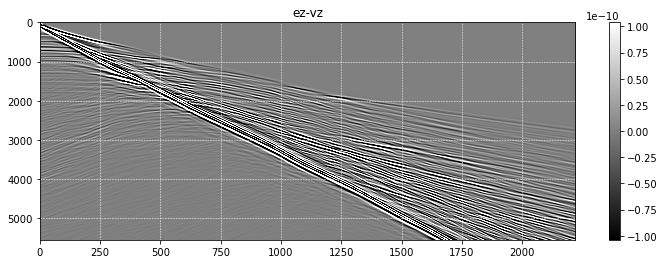

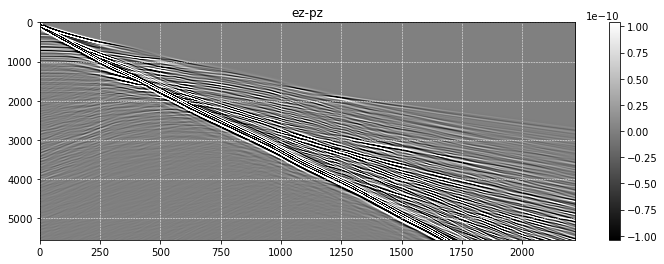

In [409]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1_ez=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1_ez,perc=90,title='ez-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2_ez,perc=90,title='ez-pz',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

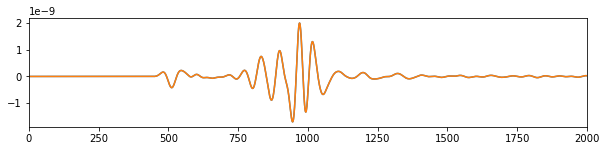

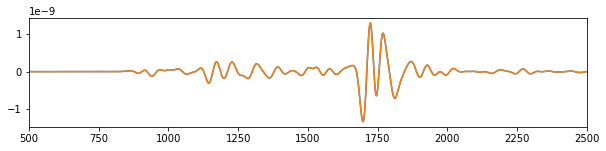

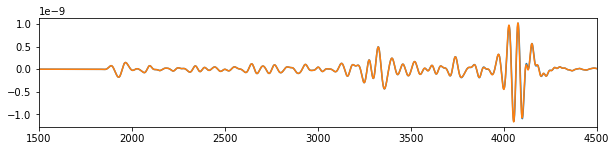

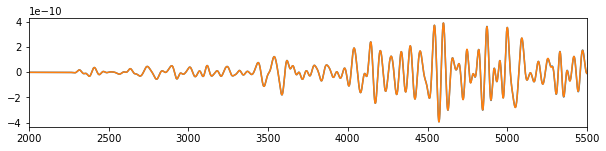

In [410]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

#### ez-vx

1.0006232


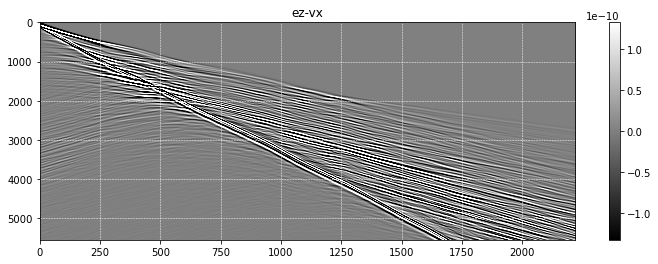

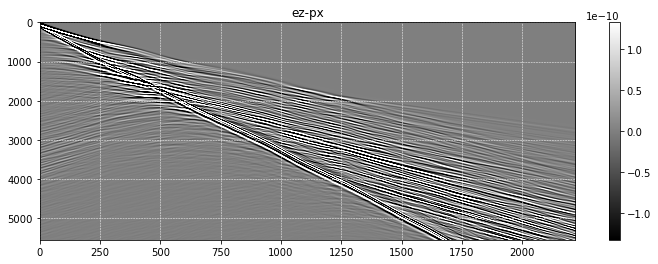

In [411]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1_ez=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1_ez,perc=90,title='ez-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2_ez,perc=90,title='ez-px',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

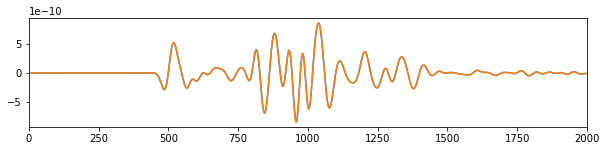

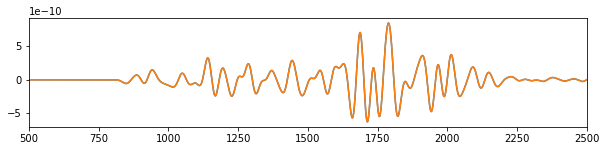

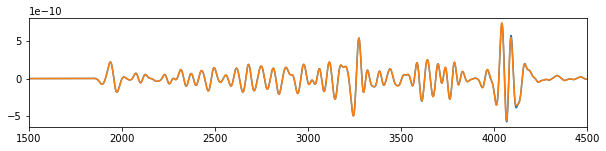

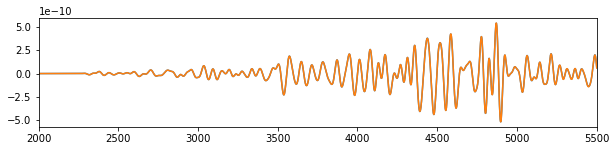

In [412]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

### ex source

In [413]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '3     0  0'" >> setup
!echo "FR           '3     0  0'" >> setup
!echo "SCOMP         ex" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ex" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 19:04 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 19:06:08
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ex
 Output directory:res_PE_overth_ex/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ex-vz

1.0062131


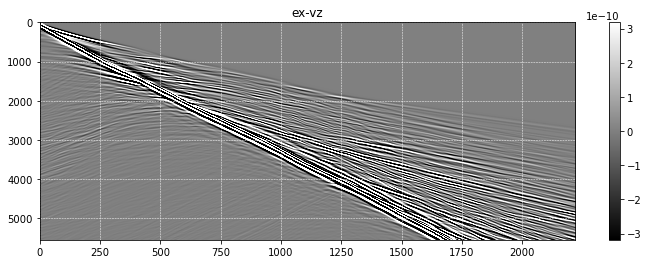

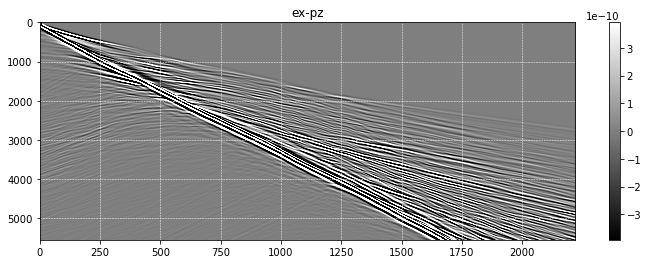

In [414]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1_ex=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1_ex,perc=90,title='ex-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2_ex,perc=90,title='ex-pz',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

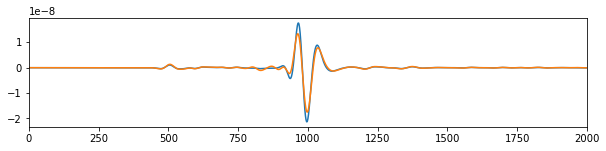

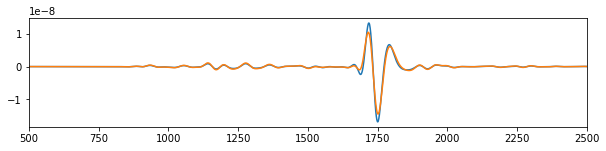

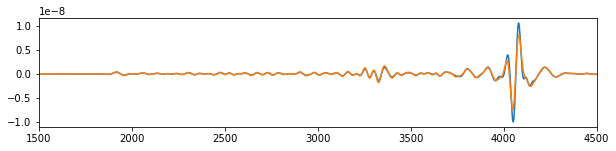

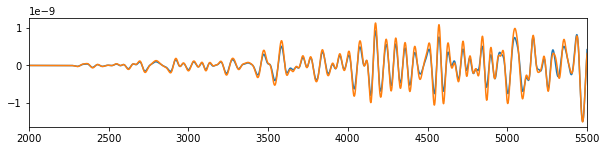

In [415]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((2000, 5500))

#### ex-vx

0.9011407


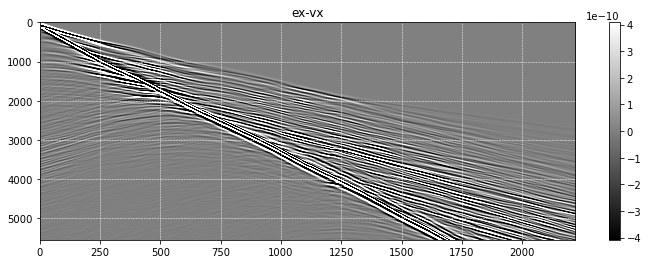

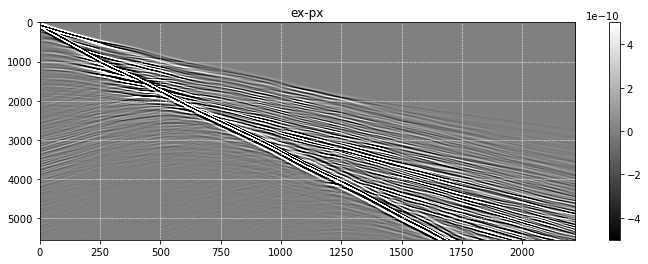

In [416]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1_ex=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1_ex,perc=90,title='ex-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2_ex,perc=90,title='ex-px',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

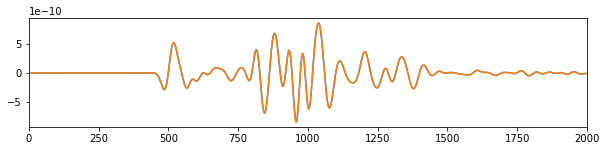

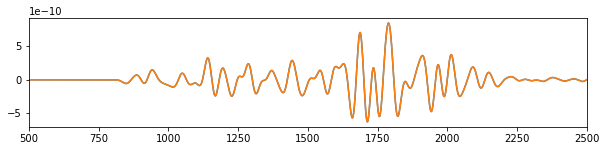

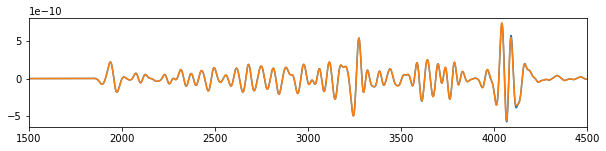

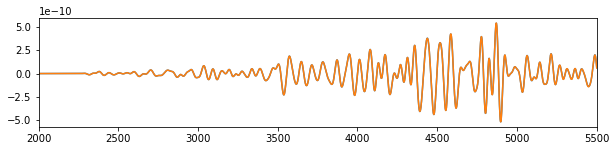

In [417]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

## Valid PE modeling vs VS modeling - far from FS

In [307]:
!bash recompile.sh

rm *.o

rm ../../mod/m_model.mod ../../mod/m_shotlist_batching.mod ../../mod/m_shot.mod ../../mod/m_computebox.mod ../../mod/m_field.mod ../../mod/m_correlate.mod ../../mod/m_cpml.mod ../../mod/m_propagator_PSV_FDSG_O4.mod ../../mod/m_Modeling.mod ../../mod/m_shotlist.mod ../../mod/m_cpml.mod ../../mod/m_propagator.mod ../../mod/m_modeling.mod ../../mod/m_propagator_WPI.mod
rm: cannot remove '../../mod/m_shotlist_batching.mod': No such file or directory
rm: cannot remove '../../mod/m_shot.mod': No such file or directory
rm: cannot remove '../../mod/m_computebox.mod': No such file or directory
rm: cannot remove '../../mod/m_field.mod': No such file or directory
rm: cannot remove '../../mod/m_correlate.mod': No such file or directory
rm: cannot remove '../../mod/m_cpml.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_PSV_FDSG_O4.mod': No such file or directory
rm: cannot remove '../../mod/m_Modeling.mod': No such file or directory
rm: cannot remove '../../mod/m_c


mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_shot.f90 -o m_shot.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_computebox.f90 -o m_computebox.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_field.f90 -o m_field.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_correlate.f90 -o m_correlate.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_

In [348]:
vp = np.interp(np.arange(ntr)/2, np.arange(nx), true[125,:nx    ] )
vs = np.interp(np.arange(ntr)/2, np.arange(nx), true[125,nx:2*nx] )

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

### vz or pz force

In [309]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         vz" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 673976 Mar 25 16:36 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 16:37:12
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth
 Output directory:res_VS_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

In [310]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         pz" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 16:36 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 16:37:41
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth
 Output directory:res_PE_overth/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_diagonal

#### vz-szz

1.000014278752709


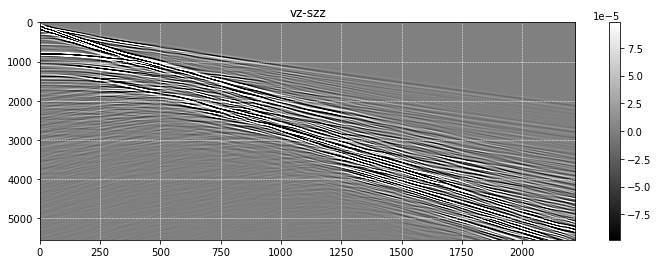

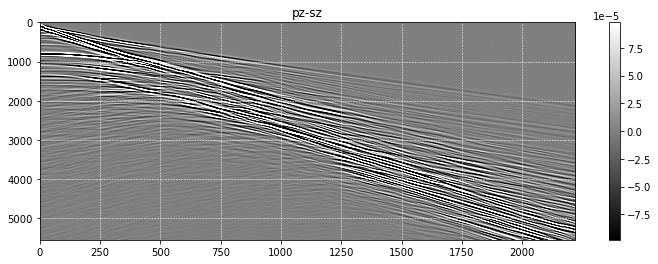

In [349]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1_sz,perc=90,title='vz-szz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sz= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2_sz,perc=90,title='pz-sz',cmap='gray')

print( np.sum(np.abs(data1_sz)) / np.sum(np.abs(data2_sz)) )

(2000.0, 5500.0)

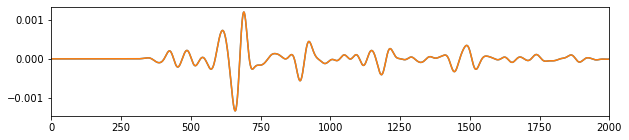

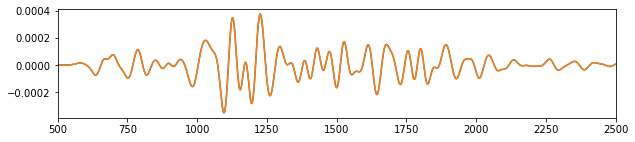

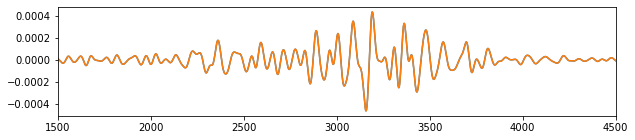

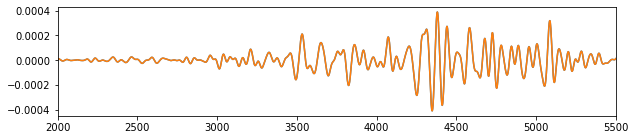

In [350]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((2000, 5500))

#### vz-sxx

1.0001081172077593


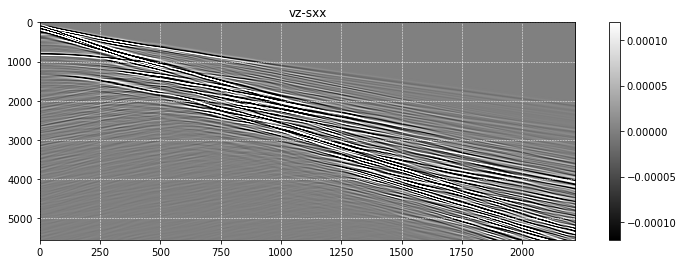

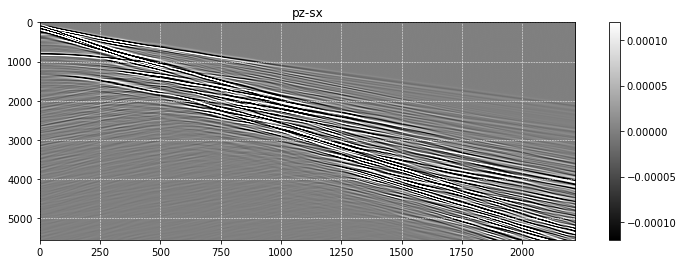

In [351]:
plt.figure(figsize=(12,4))
data1_sx=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1_sx,perc=90,title='vz-sxx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sx= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2_sx,perc=90,title='pz-sx',cmap='gray')

print( np.sum(np.abs(data1_sx)) / np.sum(np.abs(data2_sx)) )

(2000.0, 5500.0)

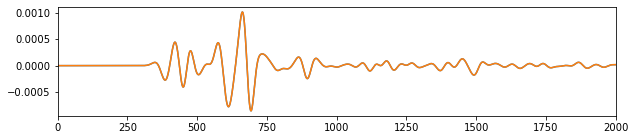

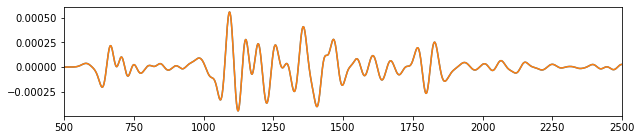

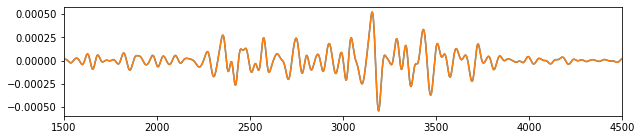

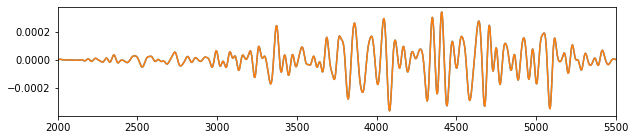

In [352]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((2000, 5500))

#### vz-ez

1.0000477432816706


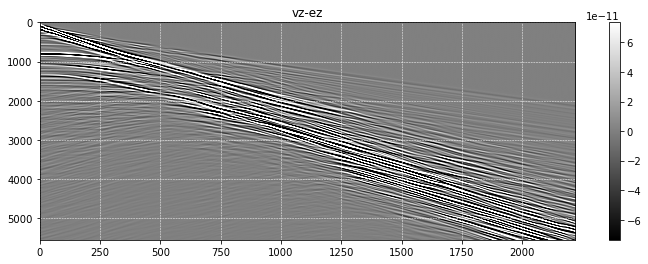

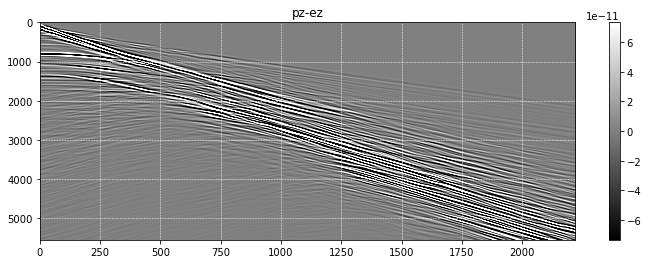

In [353]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ez= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1_ez,perc=90,title='vz-ez',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2_ez,perc=90,title='pz-ez',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

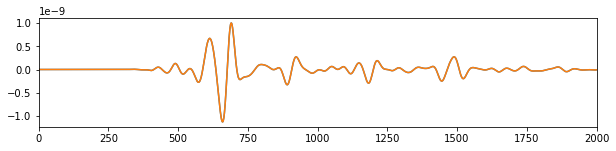

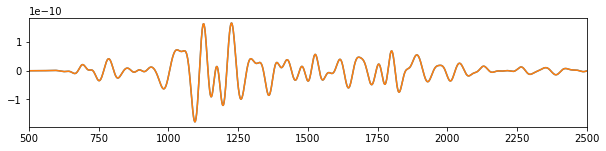

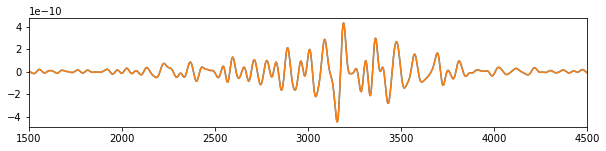

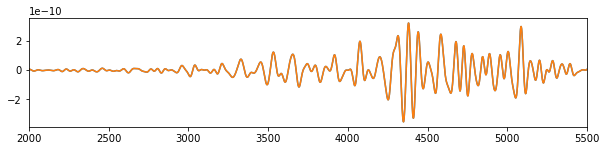

In [354]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

#### vz-ex

1.0001002371791674


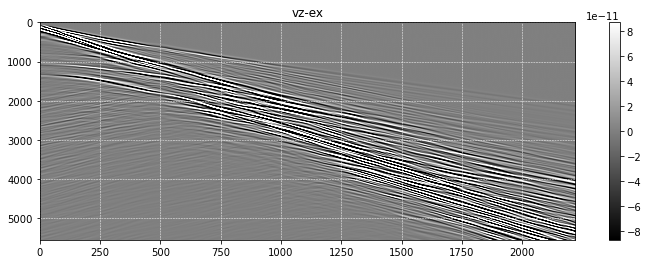

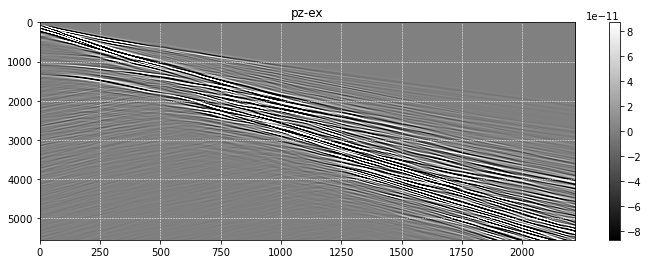

In [355]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ex= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1_ex,perc=90,title='vz-ex',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2_ex,perc=90,title='pz-ex',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

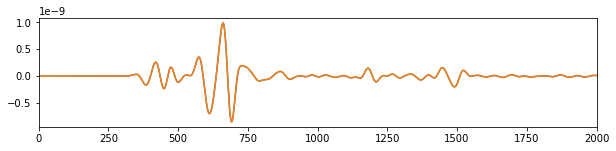

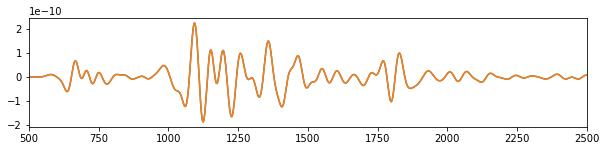

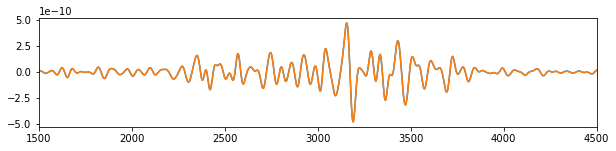

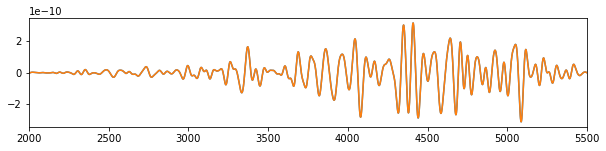

In [356]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((2000, 5500))

#### vz-ss-es

0.9996192774988328


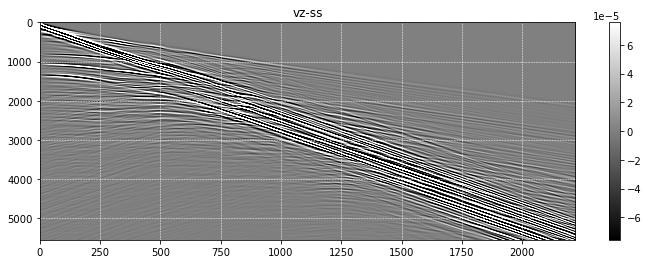

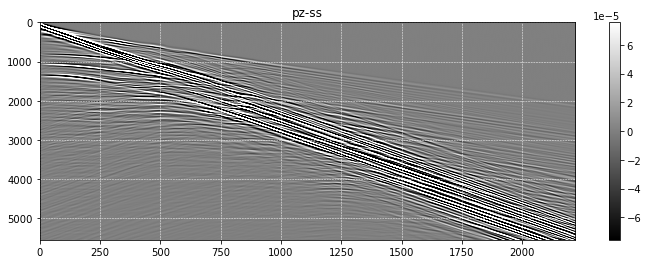

In [357]:
plt.figure(figsize=(12,4))
data1_ss=read_su('res_VS_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1_ss,perc=90,title='vz-ss',cmap='gray')

plt.figure(figsize=(12,4))
data2_ss=read_su('res_PE_overth/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2_ss,perc=90,title='pz-ss',cmap='gray')

print( np.sum(np.abs(data1_ss)) / np.sum(np.abs(data2_ss)) )

(2000.0, 5500.0)

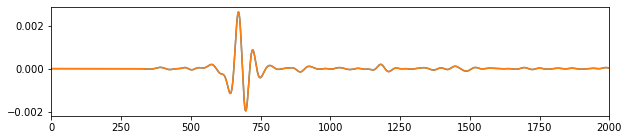

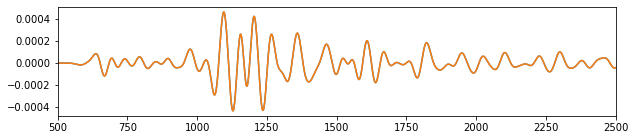

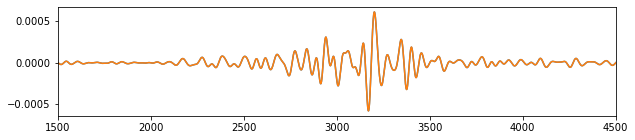

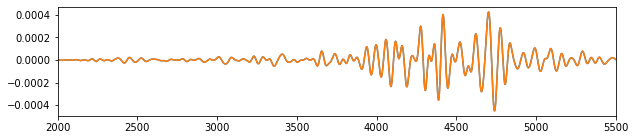

In [358]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((2000, 5500))

### vx or px force

In [321]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         vx" >> setup
!echo "RCOMP        'szz sxx szx'" >> setup
!echo "DIR_OUT     res_VS_overth_vx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 673976 Mar 25 16:36 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 16:38:32
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_vx
 Output directory:res_VS_overth_vx/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

In [322]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         px" >> setup
!echo "RCOMP        'ez ex es'" >> setup
!echo "DIR_OUT     res_PE_overth_px" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 16:36 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 16:39:03
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_px
 Output directory:res_PE_overth_px/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### vx-szz

0.999907432170211


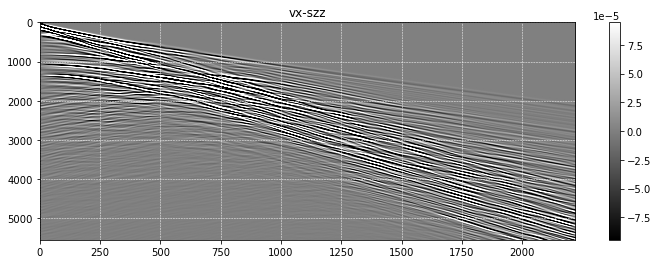

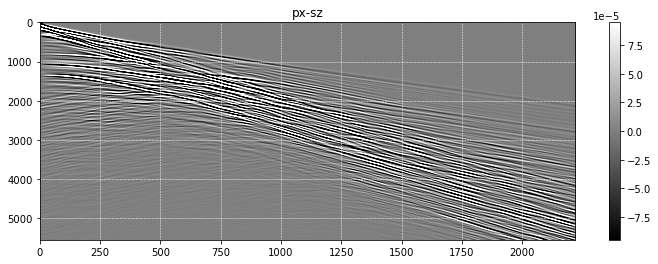

In [359]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]
imshow(data1_sz,perc=90,title='vx-szz',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sz= (lda+2.*mu)*data2_ez + lda*data2_ex ;

imshow(data2_sz,perc=90,title='px-sz',cmap='gray')

print( np.sum(np.abs(data1_sz)) / np.sum(np.abs(data2_sz)) )

(2000.0, 5500.0)

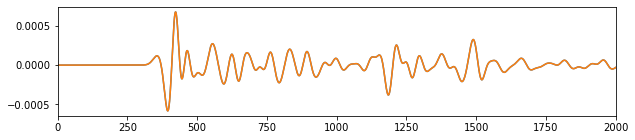

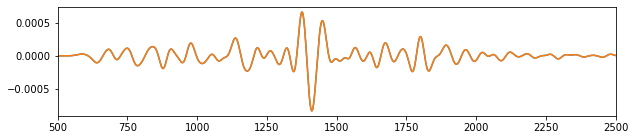

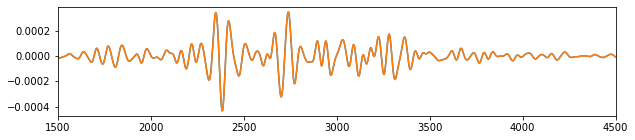

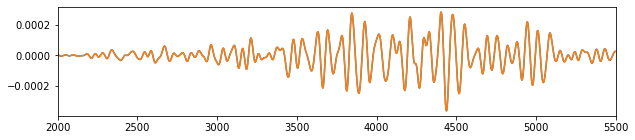

In [360]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sz[:,itr]); plt.plot(data2_sz[:,itr])
plt.xlim((2000, 5500))

#### vx-sxx

0.9998354736308077


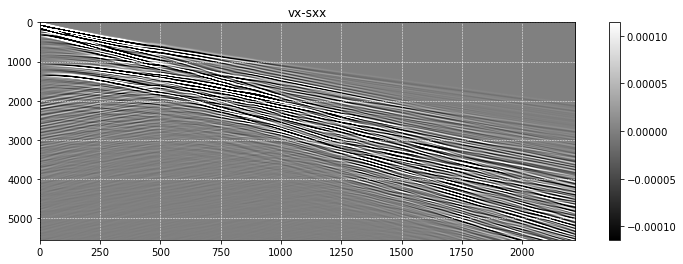

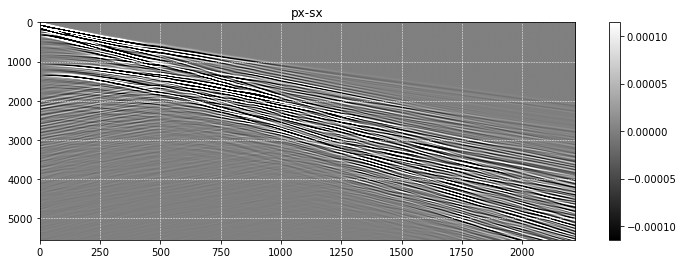

In [361]:
plt.figure(figsize=(12,4))
data1_sx=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]
imshow(data1_sx,perc=90,title='vx-sxx',cmap='gray')

plt.figure(figsize=(12,4))
data2=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))
data2_ez=data2[:,:ntr];  data2_ex=data2[:,ntr:2*ntr]

data2_sx= lda*data2_ez + (lda+2*mu)*data2_ex ;

imshow(data2_sx,perc=90,title='px-sx',cmap='gray')

print( np.sum(np.abs(data1_sx)) / np.sum(np.abs(data2_sx)) )

(2000.0, 5500.0)

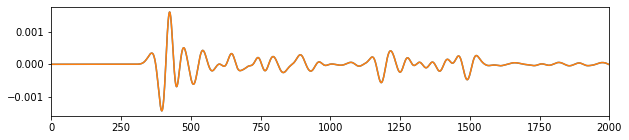

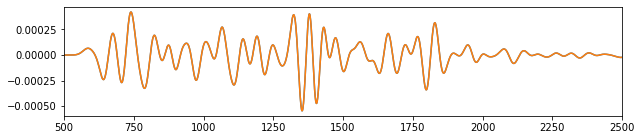

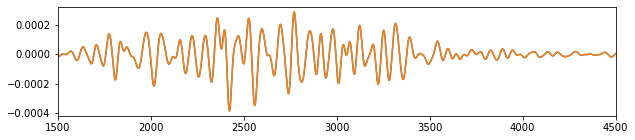

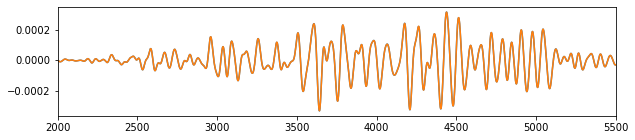

In [362]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_sx[:,itr]); plt.plot(data2_sx[:,itr])
plt.xlim((2000, 5500))

#### vx-ez

0.9999724056856973


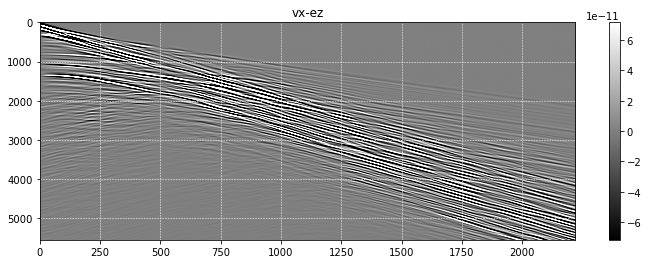

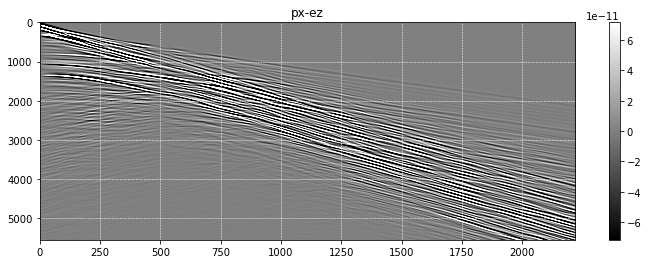

In [363]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ez= 0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz - lda*data1_sx )
imshow(data1_ez,perc=90,title='vx-ez',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,:ntr]

imshow(data2_ez,perc=90,title='px-ez',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

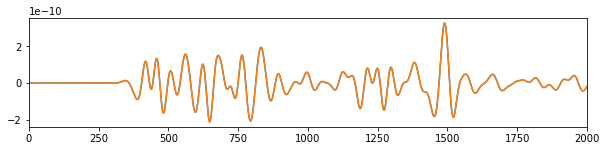

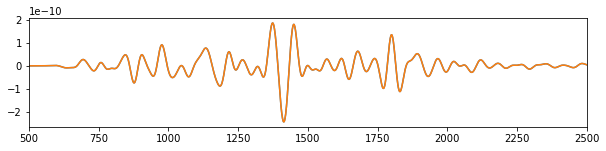

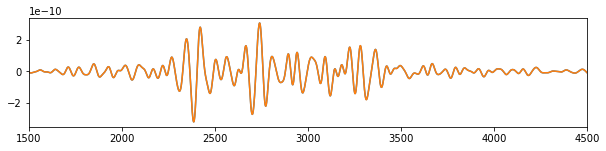

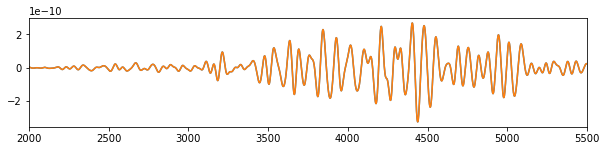

In [364]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

#### vx-ex

0.9998807906586877


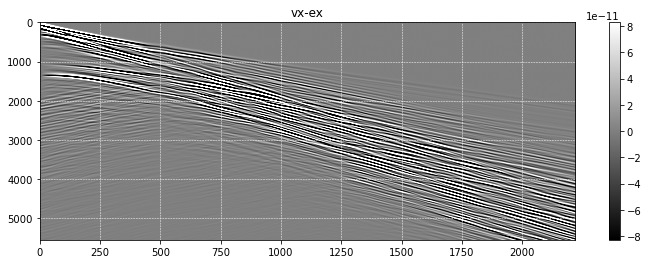

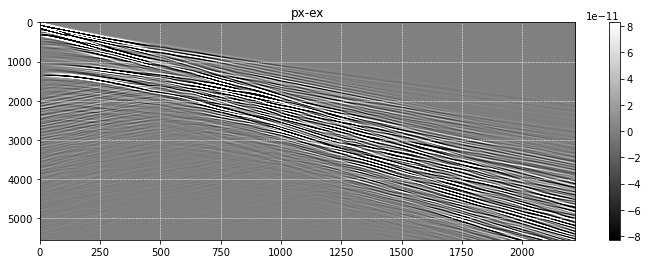

In [365]:
plt.figure(figsize=(12,4))
data1=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))
data1_sz=data1[:,:ntr];  data1_sx=data1[:,ntr:2*ntr]
data1_ex= 0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )
imshow(data1_ex,perc=90,title='vx-ex',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,ntr:2*ntr]

imshow(data2_ex,perc=90,title='px-ex',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

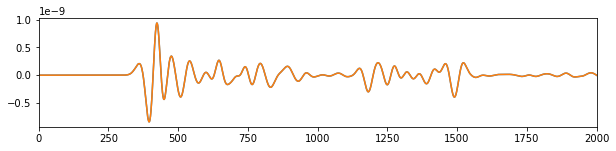

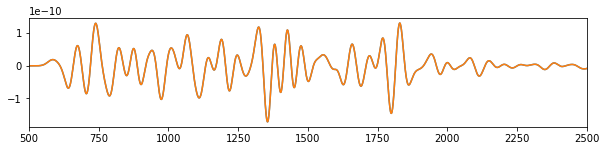

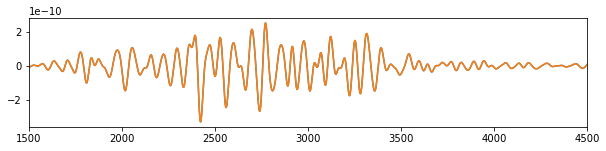

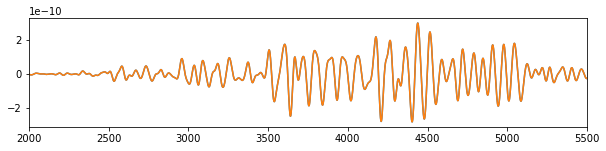

In [366]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((2000, 5500))

#### vx-ss-es

0.9995861748533145


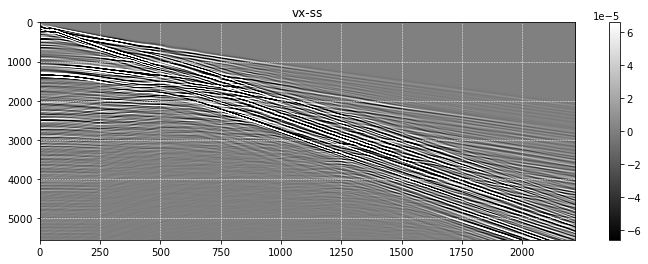

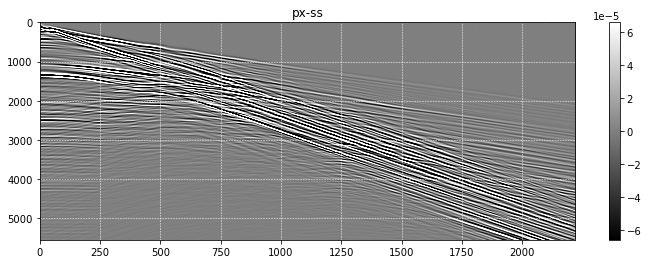

In [367]:
plt.figure(figsize=(12,4))
data1_ss=read_su('res_VS_overth_vx/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:]
imshow(data1_ss,perc=90,title='vx-ss',cmap='gray')

plt.figure(figsize=(12,4))
data2_ss=read_su('res_PE_overth_px/Ru_Shot0001.su',n=(3*ntr,nt))[:,2*ntr:] *mu
imshow(data2_ss,perc=90,title='px-ss',cmap='gray')

print( np.sum(np.abs(data1_ss)) / np.sum(np.abs(data2_ss)) )

(2000.0, 5500.0)

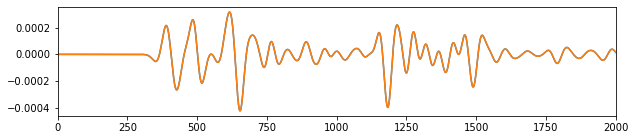

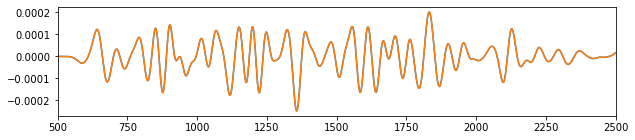

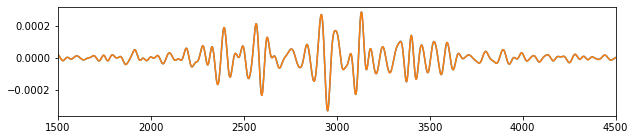

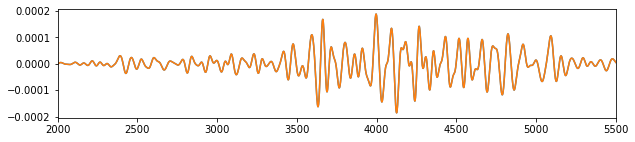

In [368]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ss[:,itr]); plt.plot(data2_ss[:,itr])
plt.xlim((2000, 5500))

## Valid PE modeling vs VS modeling - far from FS

In [333]:
!bash recompile.sh

rm *.o

rm ../../mod/m_model.mod ../../mod/m_shotlist_batching.mod ../../mod/m_shot.mod ../../mod/m_computebox.mod ../../mod/m_field.mod ../../mod/m_correlate.mod ../../mod/m_cpml.mod ../../mod/m_propagator_PSV_FDSG_O4.mod ../../mod/m_Modeling.mod ../../mod/m_shotlist.mod ../../mod/m_cpml.mod ../../mod/m_propagator.mod ../../mod/m_modeling.mod ../../mod/m_propagator_WPI.mod
rm: cannot remove '../../mod/m_shotlist_batching.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_PSV_FDSG_O4.mod': No such file or directory
rm: cannot remove '../../mod/m_Modeling.mod': No such file or directory
rm: cannot remove '../../mod/m_cpml.mod': No such file or directory
rm: cannot remove '../../mod/m_propagator_WPI.mod': No such file or directory
make: [Makefile:24: clean] Error 1 (ignored)

(cd FWD; make)
make[1]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/FWD'
#System
(cd ../Modules/System; make)
make[2]: Entering directory '/home/wzhou/Codes/GitHub/SeisJIMU/Modules/S


mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_correlate.f90 -o m_correlate.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_cpml.f90 -o m_cpml.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_propagator_DAS_FDSG_O4.f90 -o m_propagator_DAS_FDSG_O4.o

mpif90 -cpp -Dgfortran -D"git_commit='852d559'" -D"git_branch='DAS_FS'" -Ofast -fopenmp -ffree-line-length-none -fbacktrace  -fno-unsafe-math-optimizations -frounding-math -fsignaling-nans -J ../../mod/ -c m_Modeling.f90 -o m_Modeling.o


make[2]: Leaving directo

In [369]:
vp = true[125,0 ]
vs = true[125,nx]

print(vp,vs)

mu = vs**2*1.
lda= vp**2*1. - 2.*mu

1264.4324 730.0204


### ez source

In [335]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         szz" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sz" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         sxx" >> setup
!echo "RCOMP        'vz vx'" >> setup
!echo "DIR_OUT     res_VS_overth_sx" >> setup
run(app='../../exe/fwd_PSV_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 673976 Mar 25 16:39 ../../exe/fwd_PSV_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 16:40:05
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_VS_overth_sz
 Output directory:res_VS_overth_sz/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Velocity-Stress formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

 ppg%mu sanity:   240833.312       1320033.25     F F
 SNAPSHOT is NOT found, take 0, '' or F
 SNAPSHOT is NOT found, take 0, '' or F
 REF_RECT_TIME_INTEVAL (RDT) is NOT found, take default: 3.82262990E-02
 rdt, irdt = 3.77999991E-02, 21
 ----  Solving Au=s  ----
 IF_BLOOM is NOT found, take default: T
 it----         500
 fld_u minmax values:  -1.76331238E-03   1.82369025E-03
 it----        1000
 fld_u minmax values:  -1.38054788E-03   1.29747577E-03
 it----        1500
 fld_u minmax values:  -1.21880090E-03   1.35030039E-03
 it----        2000
 fld_u minmax values:  -9.66526102E-04   8.62422341E-04
 it----        2500
 fld_u minmax values:  -1.23114267E-03   1.09903619E-03
 it----        3000
 fld_u minmax values:  -1.17905997E-03   1.16299954E-03
 it----        3500
 fld_u minmax values:  -1.09272439E-03   1.00093882E-03
 it----        4000
 fld_u minmax values:  -1.16043398E-03   9.67396132E-04
 it----        4500
 fld_u minmax values:  -8.17289227E-04   9.58435703E-04
 it----     

In [336]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         ez" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ez" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 16:40 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 16:40:57
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ez
 Output directory:res_PE_overth_ez/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ez-vz

1.0000721


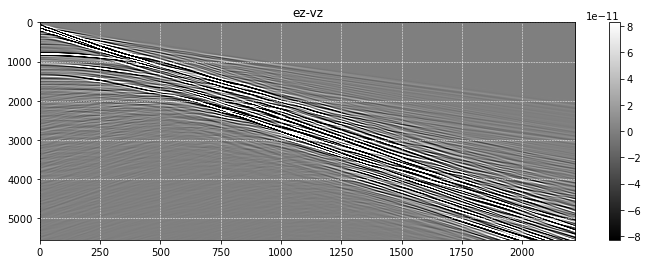

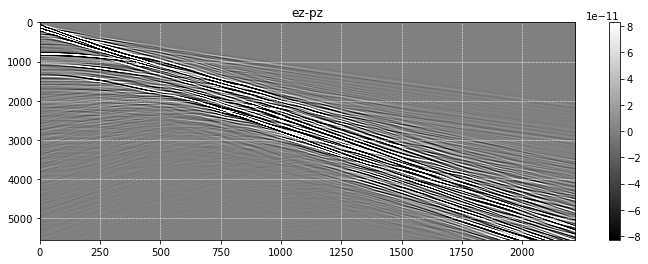

In [370]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1_ez=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1_ez,perc=90,title='ez-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2_ez,perc=90,title='ez-pz',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

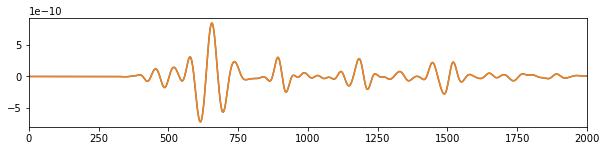

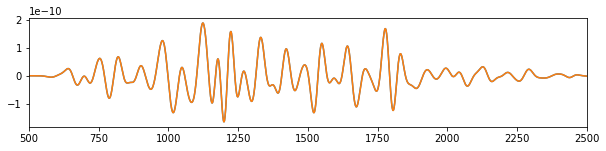

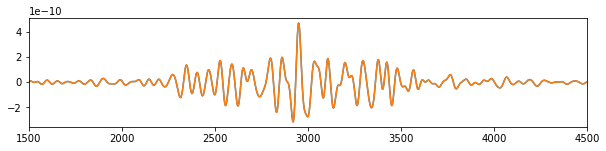

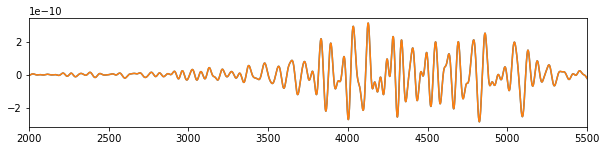

In [371]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

#### ez-vx

0.9999834


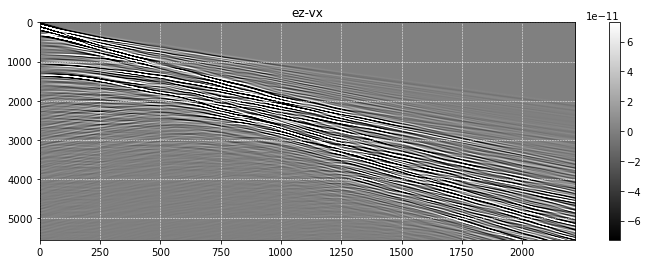

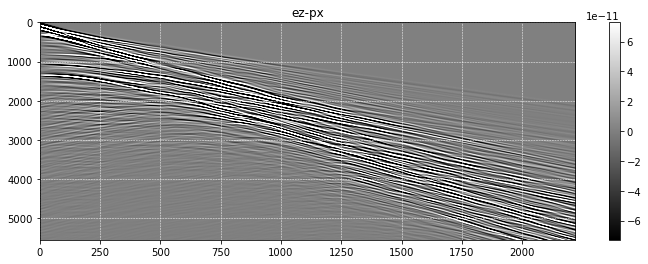

In [372]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1_ez=0.25/mu/(lda+mu)*( (lda+2*mu)*data1_sz -lda*data1_sx )

imshow(data1_ez,perc=90,title='ez-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2_ez=read_su('res_PE_overth_ez/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2_ez,perc=90,title='ez-px',cmap='gray')

print( np.sum(np.abs(data1_ez)) / np.sum(np.abs(data2_ez)) )

(2000.0, 5500.0)

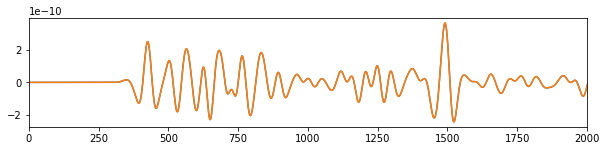

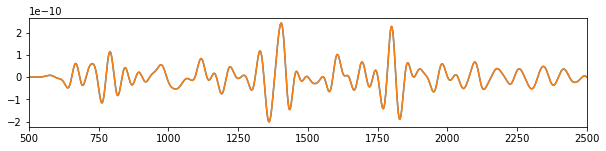

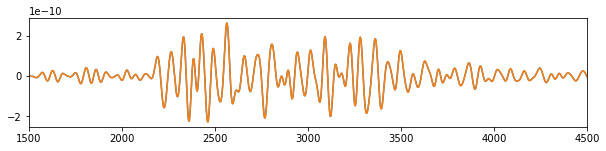

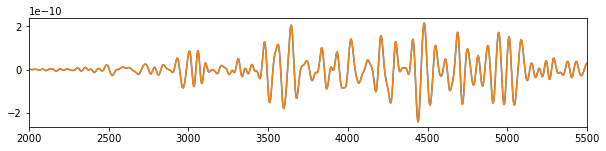

In [373]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))

### ex source

In [374]:
!cp setup_default_overthrust setup
!echo "NS    1" >> setup
!echo "FS           '750     0  0'" >> setup
!echo "FR           '750     0  0'" >> setup
!echo "SCOMP         ex" >> setup
!echo "RCOMP        'pz px'" >> setup
!echo "DIR_OUT     res_PE_overth_ex" >> setup
run(app='../../exe/fwd_DAS_FDSG_O4_')

 MPIWorld info:
  MPI_INIT_THREAD level:           0
  Number of MPI processors:           1
  Max number of OMP threads / processor:           8
 Working directory: (pwd)
/home/wzhou/Codes/GitHub/SeisJIMU/Demo/01_ForwardModeling_DAS_Freesurface
 Using executable: (ls -l $exe)
-rwxrwxr-x 1 wzhou wzhou 668320 Mar 25 16:40 ../../exe/fwd_DAS_FDSG_O4_
 Git Commit: 852d559
 Git Branch: DAS_FS
 Compiler: gfortran v11.4.0
 Version: 11.4.0
 Endianness:         1234
 System date: 03/25/2024
System time: 18:59:51
System timezone: +03:00
                        
   WELCOME TO SeisJIMU FWD MODELING   
 Setup file: setup
 DIR_IN is NOT found, take default: ./
 Input directory: ./
 DIR_OUT : res_PE_overth_ex
 Output directory:res_PE_overth_ex/
 Invoked field & propagator modules info : 
Time-domain ISOtropic 2D P-SV (ELastic) propagation
1st-order Momemtum-Strain formulation
Vireux-Levandar Staggered-Grid Finite-Difference (FDSG) method
Cartesian O(x⁴,t²) stencil
CFL = Σ|coef| *Vmax *dt /rev_cell_di

#### ex-vz

1.0000782


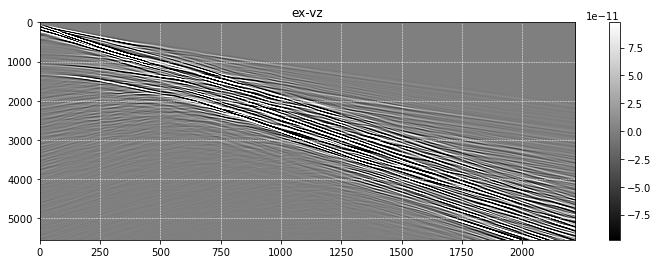

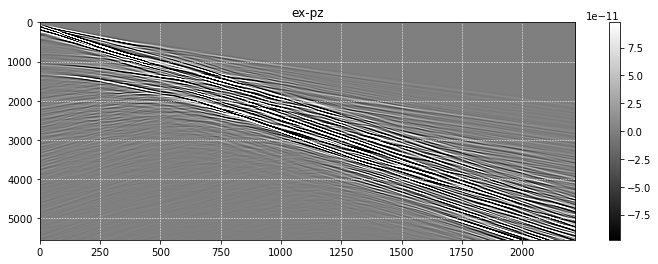

In [375]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]

data1_ex=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1_ex,perc=90,title='ex-vz',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,:ntr]
imshow(data2_ex,perc=90,title='ex-pz',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

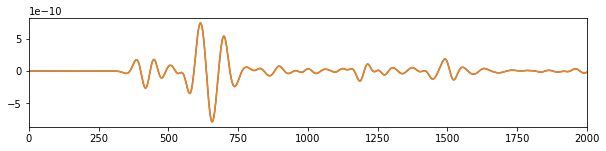

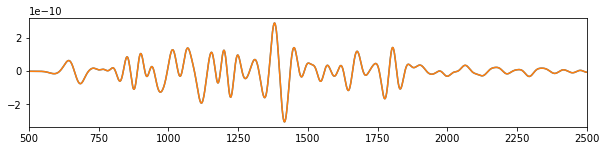

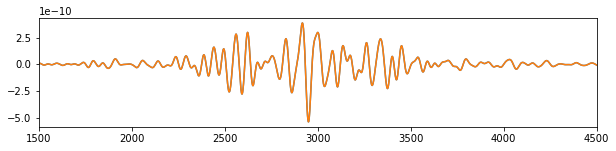

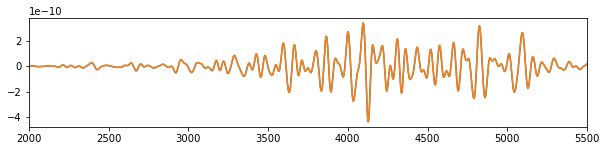

In [376]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ex[:,itr]); plt.plot(data2_ex[:,itr])
plt.xlim((2000, 5500))

#### ex-vx

0.9999018


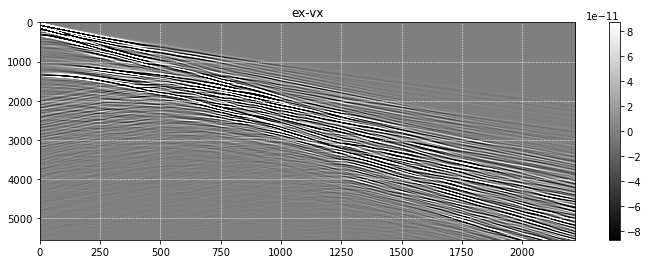

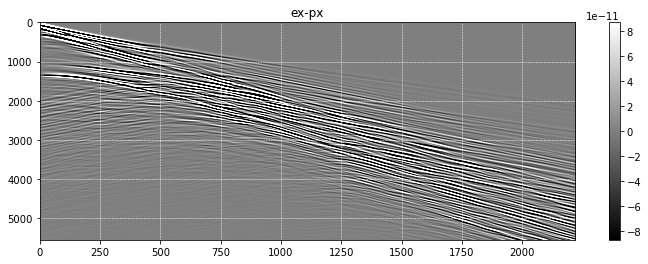

In [377]:
plt.figure(figsize=(12,4))
data1_sz=read_su('res_VS_overth_sz/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
data1_sx=read_su('res_VS_overth_sx/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]

data1_ex=0.25/mu/(lda+mu)*( -lda*data1_sz +(lda+2*mu)*data1_sx )

imshow(data1_ex,perc=90,title='ex-vx',cmap='gray')

plt.figure(figsize=(12,4))
data2_ex=read_su('res_PE_overth_ex/Ru_Shot0001.su',n=(2*ntr,nt))[:,ntr:]
imshow(data2_ex,perc=90,title='ex-px',cmap='gray')

print( np.sum(np.abs(data1_ex)) / np.sum(np.abs(data2_ex)) )

(2000.0, 5500.0)

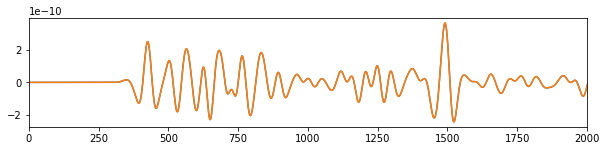

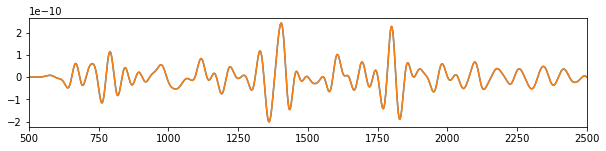

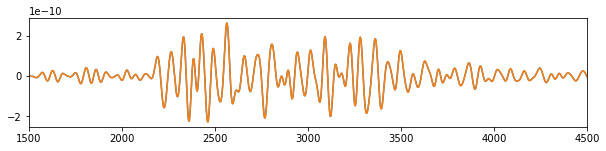

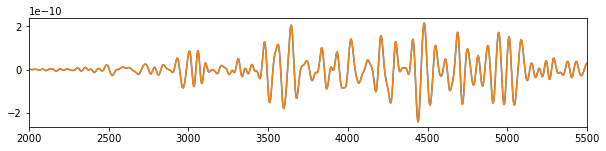

In [378]:
plt.figure(figsize=(10,2)); itr=250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((0, 2000))

plt.figure(figsize=(10,2)); itr=500
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((500, 2500))

plt.figure(figsize=(10,2)); itr=1250
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((1500, 4500))

plt.figure(figsize=(10,2)); itr=1750
plt.plot(data1_ez[:,itr]); plt.plot(data2_ez[:,itr])
plt.xlim((2000, 5500))